In [1]:
# Strive2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
cv2.__version__

'4.5.4'

In [2]:
# open images
img = cv2.imread('images/cat.jpg')
type(img)

numpy.ndarray

In [3]:
# display the image
cv2.imshow('Image', img)
# get time to see the image
cv2.waitKey(0)
# close pop up windows that have been created
cv2.destroyAllWindows()
# fix so it doesnt crash
cv2.waitKey(1)

In [4]:
#### OpenCV uses        B G R
#### Matplotlib expects R G B

plt.figure(figsize=(20,15))
# plt.imshow(img)

rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# plt.imshow(rgb_img)

# need to specify colormap for gray scale
# plt.imshow(gray_img, cmap='gray')

<Figure size 1440x1080 with 0 Axes>

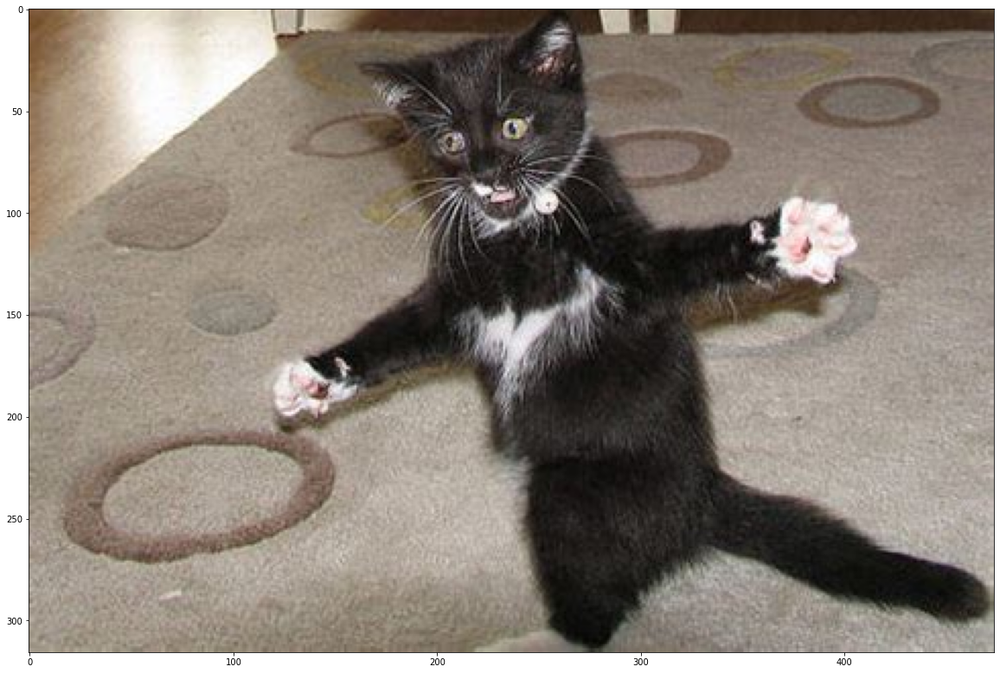

In [5]:
plt.figure(figsize=(20,15))
plt.imshow(rgb_img)

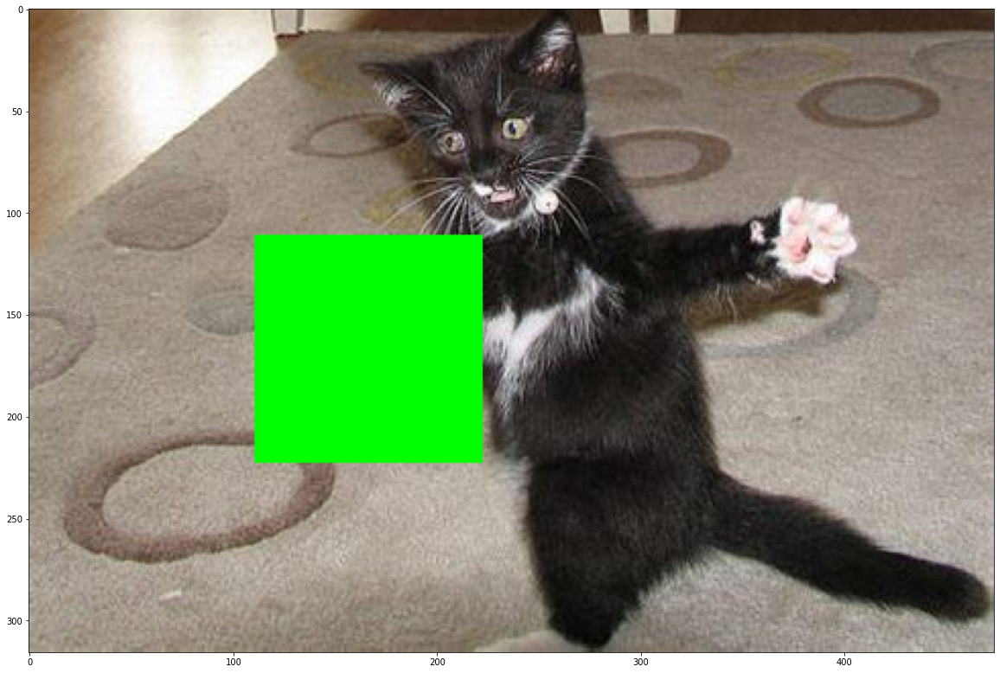

In [6]:
# how to draw rectangles on top of an image

img_copy = rgb_img.copy()

# (111,111) first point of the rectangle, (222,222) second point
# cv2.rectangle(img_copy, (111,111), (222,222), (0,255,0), 4) # 4=thickness
# cv2.rectangle(img_copy, (111,111), (222,222), (0,255,0), -1) # -1=FILLED rectangle
cv2.rectangle(img_copy, (111,111), (222,222), (0,255,0), cv2.FILLED)

plt.figure(figsize=(20,15))
plt.imshow(img_copy)

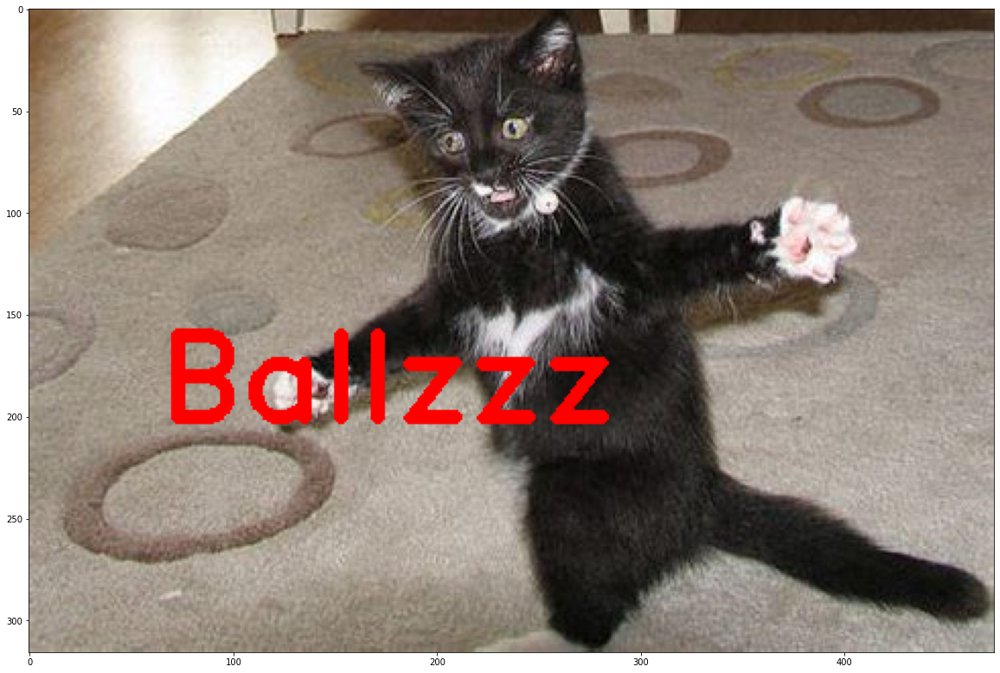

In [7]:
# annotate text

img_copy2 = rgb_img.copy()

# 2=font size, 3=thickness, (64=x axis,201=y axis)
cv2.putText(img_copy2, 'Ballzzz', (64,201), cv2.FONT_HERSHEY_DUPLEX, 2, (255,0,0), 3)

plt.figure(figsize=(20,15))
plt.imshow(img_copy2)

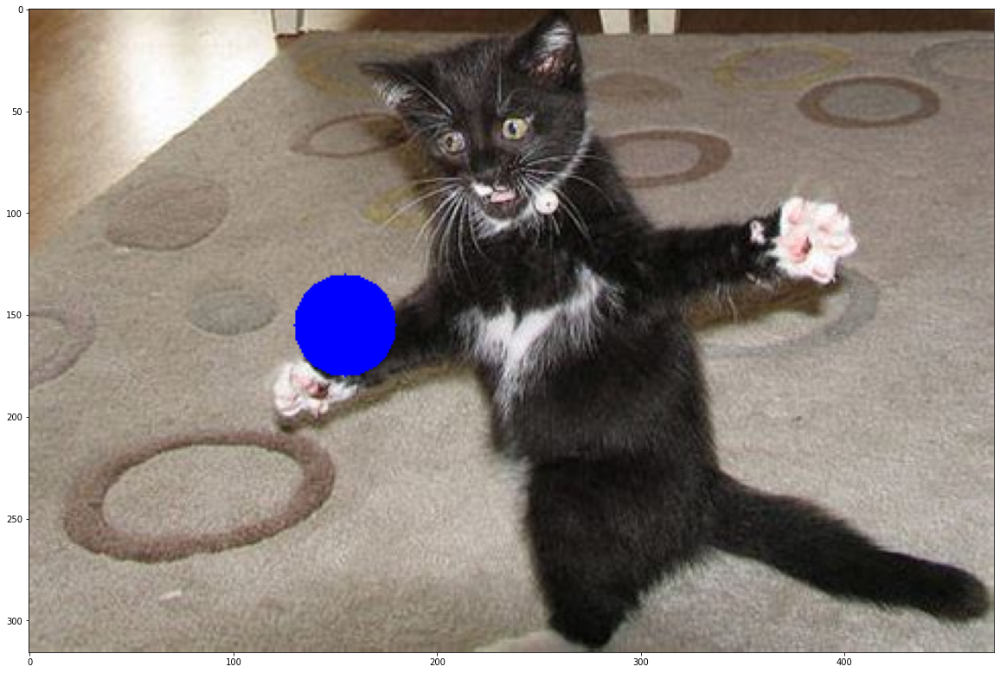

In [8]:
# how to draw circles

img_copy3 = rgb_img.copy()

# (155,155)=center of circle, 25=radius
cv2.circle(img_copy3, (155,155), 25, (0,0,255), cv2.FILLED)

plt.figure(figsize=(20,15))
plt.imshow(img_copy3)

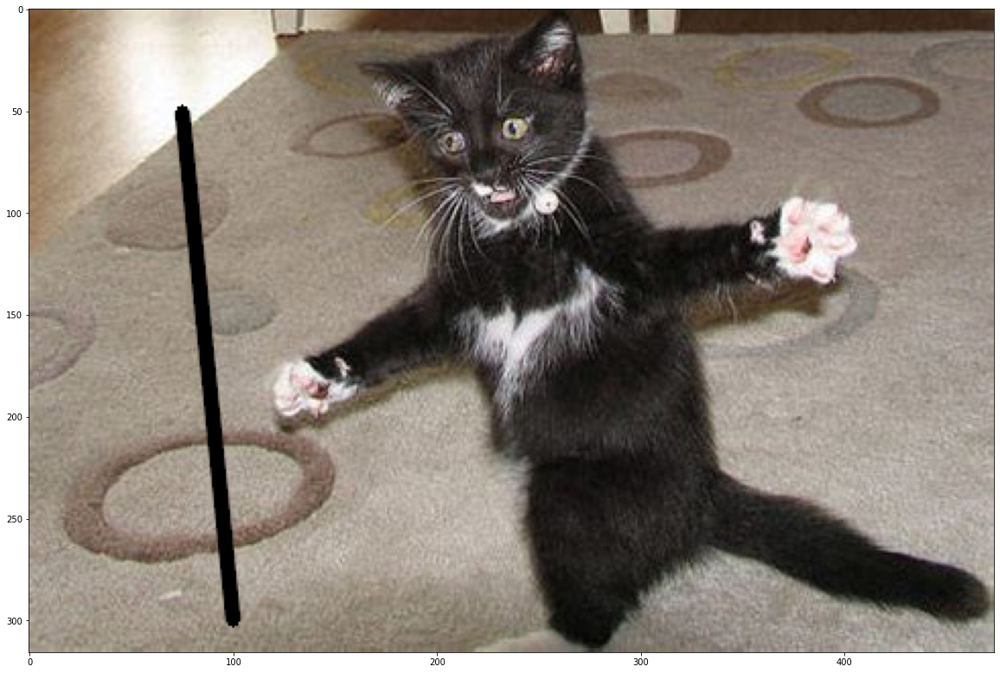

In [52]:
# lines
img_copy4 = rgb_img.copy()

# (21,133)=start, (44,204)=end, color, 2=thickness
cv2.line(img_copy4, (100,300), (75,50), (0,0,0), 5, lineType=11)

plt.figure(figsize=(20,15))
plt.imshow(img_copy4)

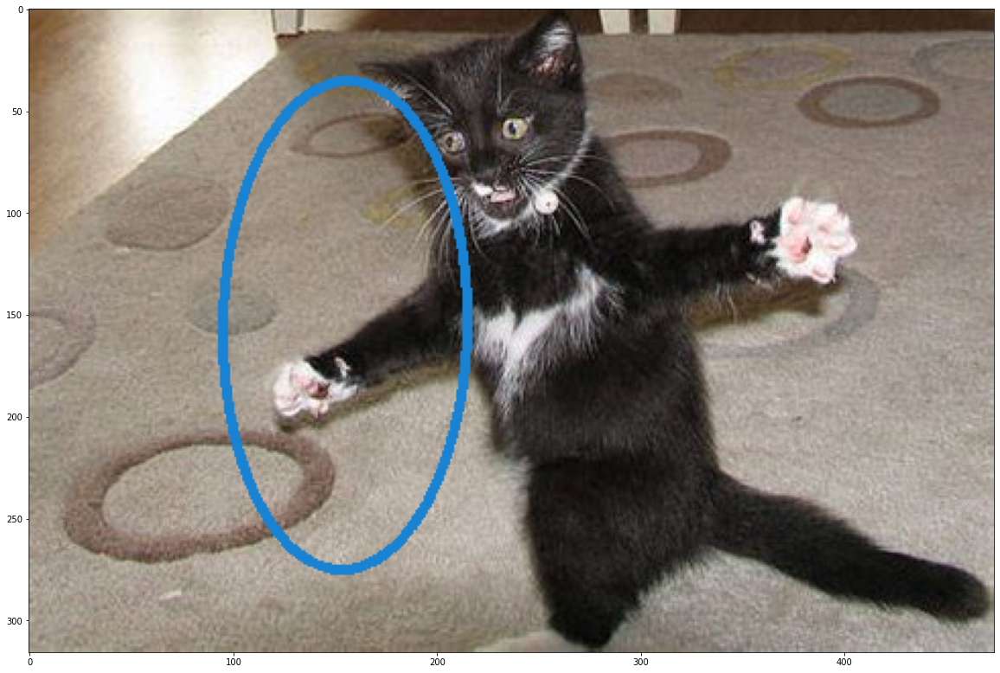

In [54]:
# ellipses
img_copy5 = rgb_img.copy()

# (155,155)=center, (22,88)=axes, 1=rotation, 0,360=start+end of the elliptic arc in degrees, 3=thickness
cv2.ellipse(img_copy5, (155,155), (60,120), 1, 0,360, (25,130,210), 3)

plt.figure(figsize=(20,15))
plt.imshow(img_copy5)

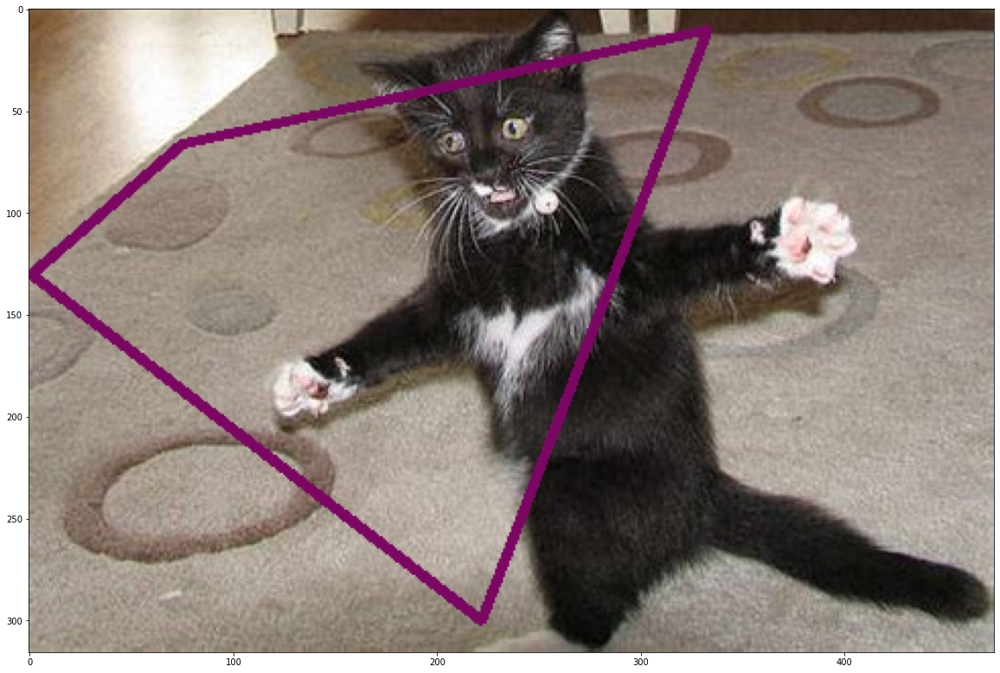

In [55]:
# poligons/ polylines
img_copy6 = rgb_img.copy()

# isClosed=True
points = np.array([[75,66],[1,130],[222,300],[333,10]], np.int32).reshape((-1,1,2))
cv2.polylines(img_copy6, [points], True, (123,7,99), 3)

plt.figure(figsize=(20,15))
plt.imshow(img_copy6)

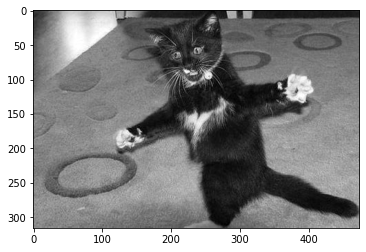

In [12]:
# split the channels of the image
R, G, B = cv2.split(rgb_img)
plt.imshow(R, cmap='gray') 
plt.imshow(B, cmap='gray')

In [13]:
R, cv2.add(R, 1) # 300 instead of 1 -> won't go above 255

(array([[128, 128, 128, ...,  74,  83,  83],
        [129, 130, 128, ...,  76,  84,  84],
        [127, 127, 126, ...,  65,  72,  72],
        ...,
        [156, 155, 154, ..., 178, 187, 181],
        [168, 167, 165, ..., 184, 186, 176],
        [167, 165, 164, ..., 185, 190, 175]], dtype=uint8),
 array([[129, 129, 129, ...,  75,  84,  84],
        [130, 131, 129, ...,  77,  85,  85],
        [128, 128, 127, ...,  66,  73,  73],
        ...,
        [157, 156, 155, ..., 179, 188, 182],
        [169, 168, 166, ..., 185, 187, 177],
        [168, 166, 165, ..., 186, 191, 176]], dtype=uint8))

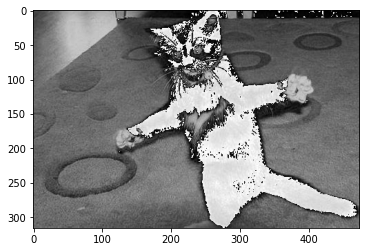

In [14]:
R_overflow = R + 200 # goes to 0, then up again
                     # 128 + 200 = 255 + 72 -> will show 72
R_increased = cv2.add(R, 200)

plt.imshow(R_overflow, cmap='gray')

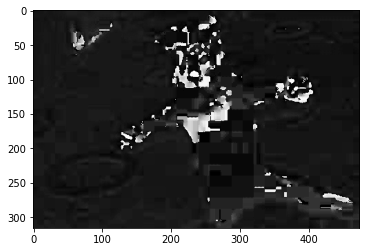

In [15]:
hsv_img = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2HSV)
H, S, V = cv2.split(hsv_img)

plt.imshow(H, cmap='gray')

## HSV and Applying Masks

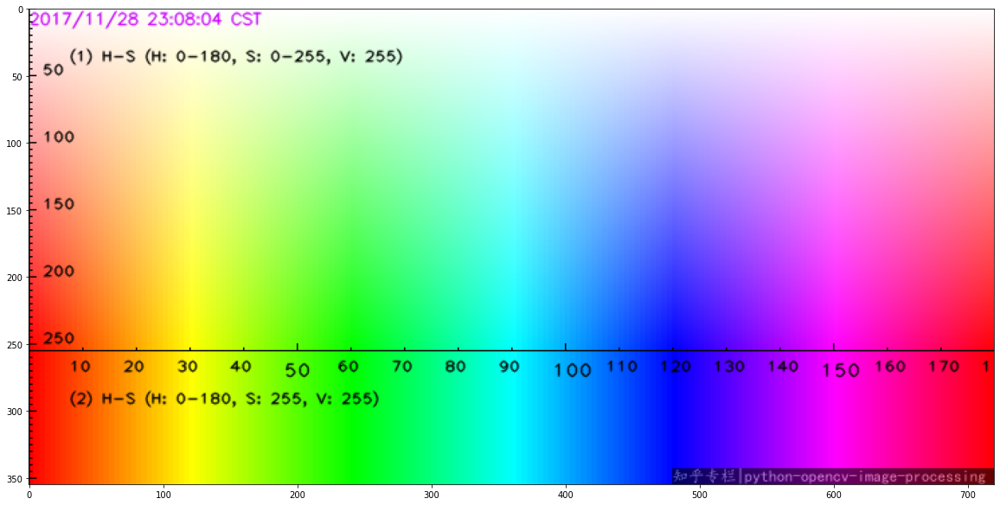

In [16]:
hsv_colors = cv2.imread('images/HSV_color_space.png')
hsv_colors = cv2.cvtColor(hsv_colors, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,15))
plt.imshow(hsv_colors)

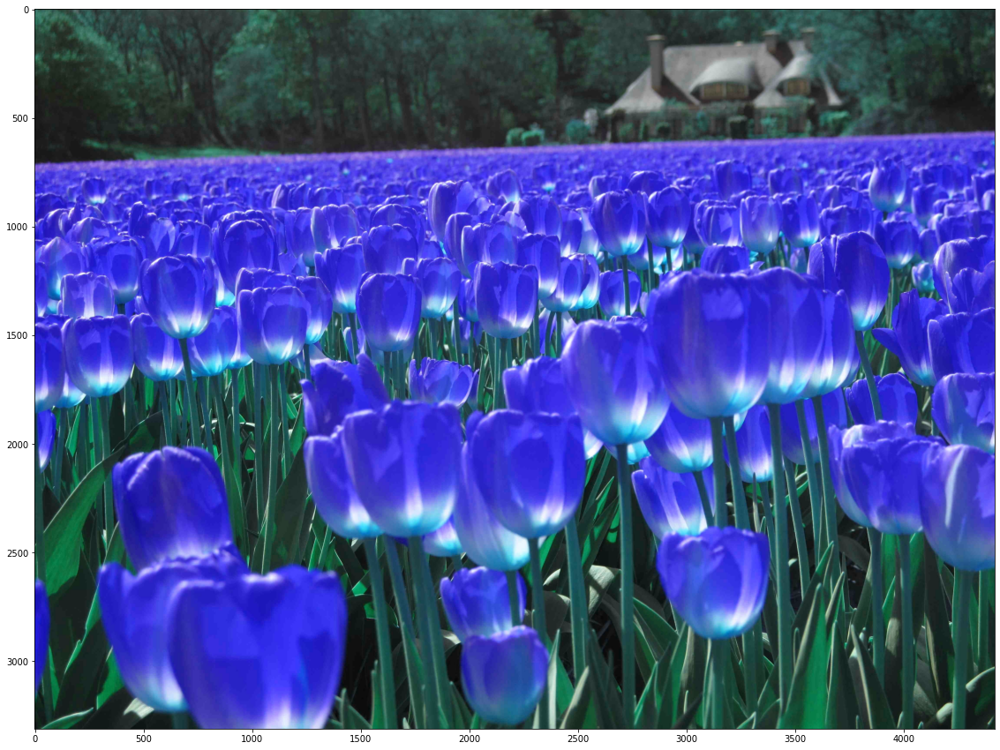

In [17]:
bgr_flowers = cv2.imread('images/flowers.jpg')
hsv_flowers = cv2.cvtColor(bgr_flowers, cv2.COLOR_BGR2HSV)

plt.figure(figsize=(20,15))
plt.imshow(bgr_flowers)

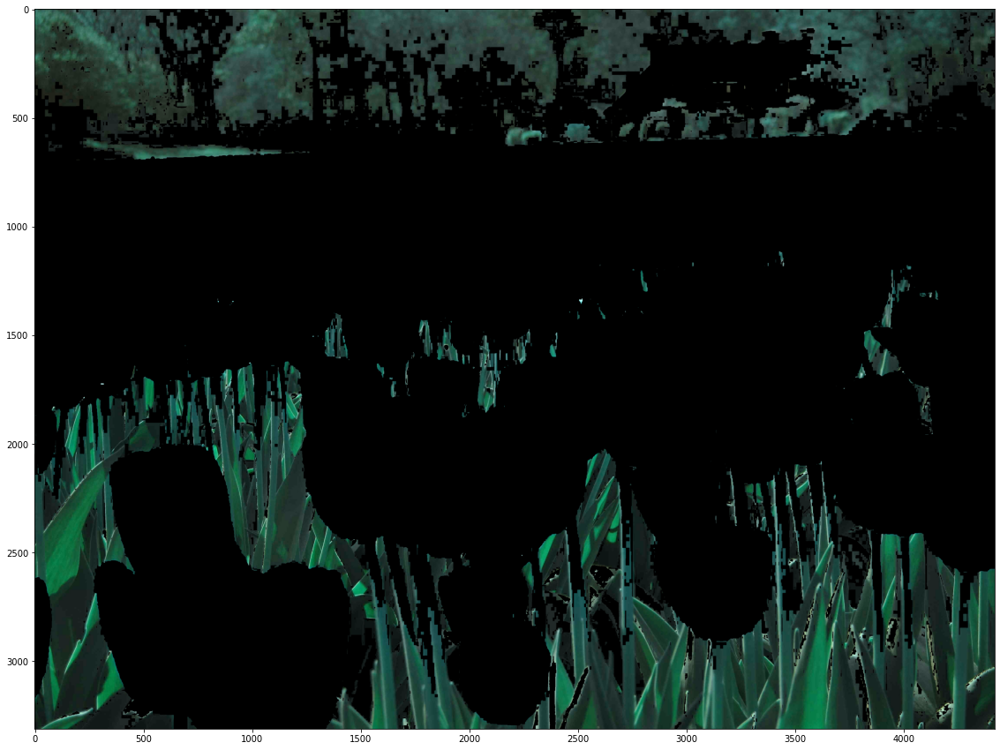

In [56]:
# x axis Hue (0 - 180)
# y axis Saturation (0 - 255)
# V = shadows, brightness = (20 - 255) -> 0 is pure white

lower_bounds = (30,50,20) # for greens
upper_bounds = (90,255,255)
mask = cv2.inRange(hsv_flowers, lower_bounds, upper_bounds)

masked_flowers = bgr_flowers.copy()

# apply mask
masked_flowers[mask == 0] = [0,0,0] # black color stays black
# masked_flowers = cv2.bitwise_and(new_bgr_img, new_bgr_img, mask=mask)
# masked_flowers[mask != 0] = [0,0,0]

plt.figure(figsize=(20,15))
plt.imshow(masked_flowers)
# plt.imshow(mask, cmap='gray')

## M&M Challenge

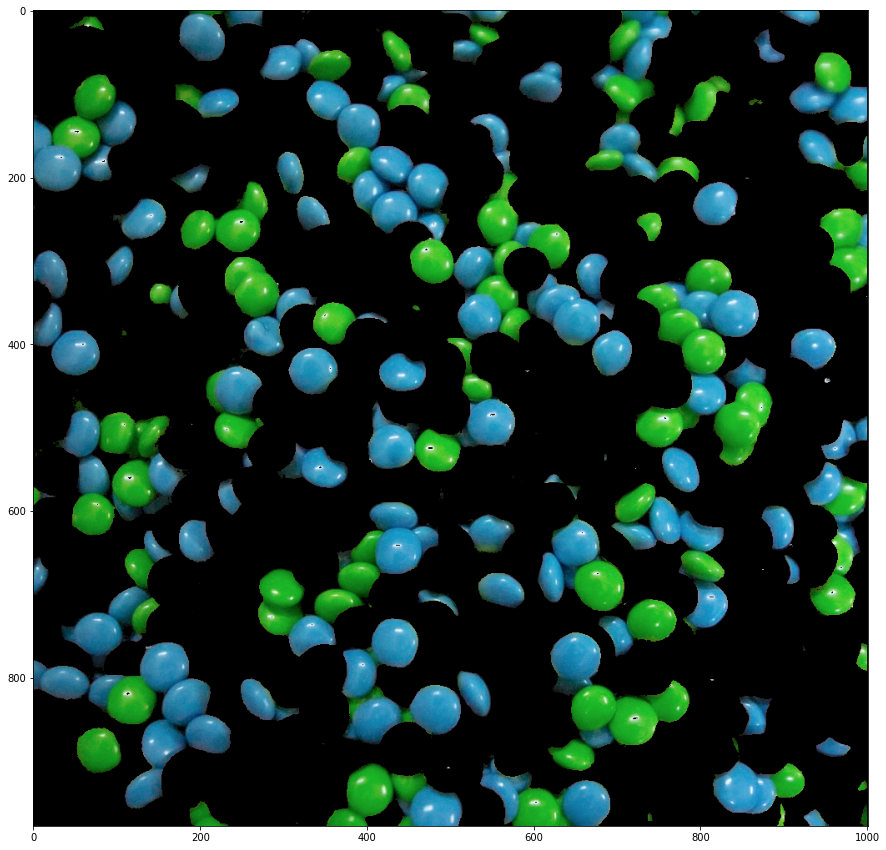

In [29]:
bgr_mandm = cv2.imread('images/mm.png', cv2.IMREAD_UNCHANGED)
hsv_mandm = cv2.cvtColor(bgr_mandm, cv2.COLOR_BGR2HSV)

plt.figure(figsize=(20,15))

### show only BLUE, GREEN or BLUE+GREEN m&ms
mask_blue = cv2.inRange(hsv_mandm, (100, 50, 20), 
                                   (130, 255, 255))
mask_green = cv2.inRange(hsv_mandm, (45, 50, 20), 
                                    (80, 255, 255))
mask_blue_green = cv2.inRange(hsv_mandm, (45, 20, 20), 
                                         (130, 255, 255))
# mask_yellow = cv2.inRange(hsv_mandm, (27, 50, 20), 
#                                      (34, 255, 255))

mandm_blue = bgr_mandm.copy()
mandm_blue = cv2.cvtColor(mandm_blue, cv2.COLOR_BGR2RGB)
mandm_green = bgr_mandm.copy()
mandm_blue_green = bgr_mandm.copy()
mandm_blue_green = cv2.cvtColor(mandm_blue_green, cv2.COLOR_BGR2RGB)
# mandm_yellow = bgr_mandm.copy()
# mandm_yellow = cv2.cvtColor(mandm_yellow, cv2.COLOR_BGR2RGB)

mandm_blue[mask_blue == 0] = [0,0,0]
mandm_green[mask_green == 0] = [0,0,0]
mandm_blue_green[mask_blue_green == 0] = [0,0,0]
# mandm_yellow[mask_yellow == 0] = [0,0,0]

plt.imshow(mandm_blue_green)

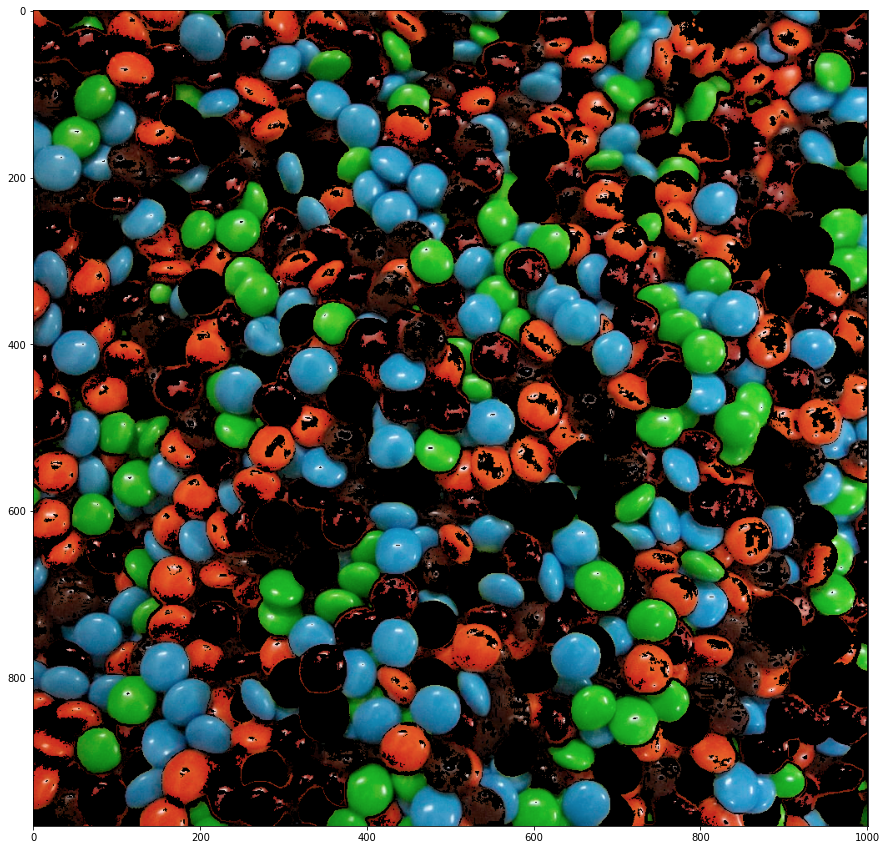

In [58]:
# show all 3 colors BLUE, GREEN and REDs
mask_red = cv2.inRange(hsv_mandm, (1, 20, 20), 
                                  (9, 255, 255))
mask_red2 = cv2.inRange(hsv_mandm, (170, 20, 20), 
                                   (180, 255, 255))

mandm_red = bgr_mandm.copy()
mandm_red = cv2.cvtColor(mandm_red, cv2.COLOR_BGR2RGB)
mandm_red[mask_red == 0] = [0,0,0]

mandm_all3 = cv2.bitwise_or(mandm_blue_green, mandm_red, mask_red2)

plt.figure(figsize=(20,15))
plt.imshow(mandm_all3)

## QRCodeDetector

WIFI:T:WPA2;S:iMore;P:iMore12345678;; [[[601.69604 425.61166]
  [837.0273  363.13437]
  [915.8054  595.2106 ]
  [679.84973 661.6051 ]]]


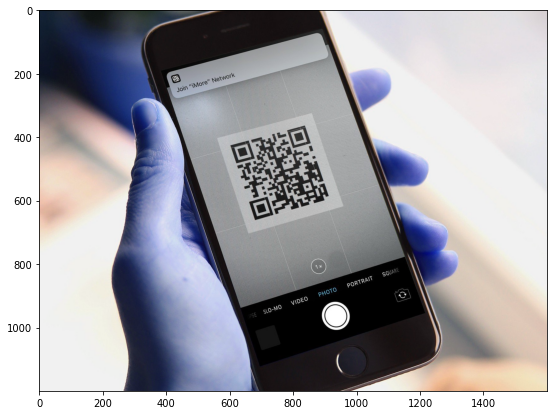

In [21]:
qr_code = cv2.imread('images/qr_code2.jpg', cv2.IMREAD_UNCHANGED)
detector = cv2.QRCodeDetector()

# data=message in qr code, bounding_box=actual qr code in image
data, bounding_box, straight_qr_code = detector.detectAndDecode(qr_code)
print(data, bounding_box)

plt.figure(figsize=(10,7))
plt.imshow(qr_code)

-1

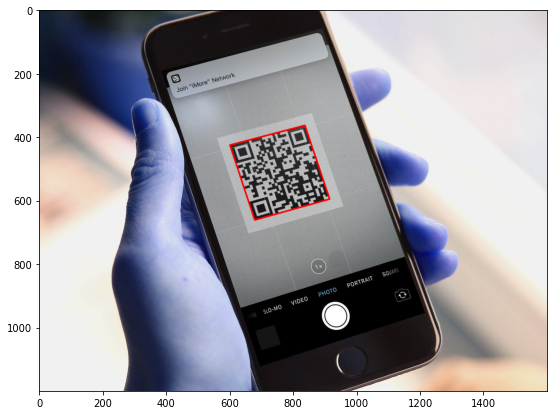

In [47]:
# draw a rectangle around the qr code
qr_code_copy = qr_code.copy()

if bounding_box is not None:
    n_lines = len(bounding_box)

    for i in range(n_lines):
        point1 = tuple(bounding_box[i][0])
        point2 = tuple(bounding_box[i][1])
        point3 = tuple(bounding_box[i][2])
        point4 = tuple(bounding_box[i][3])
        pts = np.array([point1, point2, point3, point4], np.int32).reshape((-1,1,2))
        cv2.polylines(qr_code_copy, [pts], True, (255,0,0), 3)

        # save the qr region to disk
        top_left_x = int(min([ point1[0], point2[0], point3[0], point4[0] ]))
        top_left_y = int(min([ point1[1], point2[1], point3[1], point4[1]]))
        bot_right_x = int(max([ point1[0], point2[0], point3[0], point4[0]]))
        bot_right_y = int(max([ point1[1], point2[1], point3[1], point4[1]]))

        crop = qr_code_copy[top_left_y:bot_right_y+1, top_left_x:bot_right_x+1]
        cv2.imwrite('images/saved_qr_code.jpg', crop)

plt.figure(figsize=(10,7))
plt.imshow(qr_code_copy)

cv2.imshow('QR Code', crop)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

## Object detection using HSV Color space

In [24]:
# break

cap = cv2.VideoCapture(0)

def nothing():
    pass

cv2.namedWindow('n1')

cv2.createTrackbar('Low - H', 'n1', 0, 179, nothing)
cv2.createTrackbar('Low - S', 'n1', 0, 255, nothing)
cv2.createTrackbar('Low - V', 'n1', 0, 255, nothing)
cv2.createTrackbar('Upper - H', 'n1', 0, 179, nothing)
cv2.createTrackbar('Upper - S', 'n1', 0, 255, nothing)
cv2.createTrackbar('Upper - V', 'n1', 0, 255, nothing)

l_h = cv2.getTrackbarPos('Low - H', 'n1')
l_s = cv2.getTrackbarPos('Low - S', 'n1')
l_v = cv2.getTrackbarPos('Low - V', 'n1')
u_h = cv2.getTrackbarPos('Upper - H', 'n1')
u_s = cv2.getTrackbarPos('Upper - S', 'n1')
u_v = cv2.getTrackbarPos('Upper - V', 'n1')

while True:
    _, frame = cap.read()
    width = int(cap.get(3))
    height = int(cap.get(4))

    hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
    lower_b = (l_h, l_s, l_v)
    upper_b = (u_h, u_s, u_v)
    # lower_b = (15,50,20)
    # upper_b = (45,255,255)

    mask_new = cv2.inRange(hsv, lower_b, upper_b)
    result = cv2.bitwise_and(frame, frame, mask=mask_new)

    # cv2.imshow('Frame', frame)
    cv2.imshow('Result', result)
    # cv2.imshow('Mask', mask_new)

    if cv2.waitKey(1) == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()

SyntaxError: 'break' outside loop (Temp/ipykernel_12388/3535644039.py, line 1)